In [4]:
import os
# if using Apple MPS, fall back to CPU for unsupported ops
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image
from pycocotools import mask as maskUtils

In [5]:
# select the device for computation
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


In [6]:
np.random.seed(3)

def show_mask(mask, ax, random_color=False, borders = True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask = mask.astype(np.uint8)
    mask_image =  mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    if borders:
        import cv2
        contours, _ = cv2.findContours(mask,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) 
        # Try to smooth contours
        contours = [cv2.approxPolyDP(contour, epsilon=0.01, closed=True) for contour in contours]
        mask_image = cv2.drawContours(mask_image, contours, -1, (1, 1, 1, 0.5), thickness=2) 
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=250):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   

def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))    

def show_masks(image, masks, scores, point_coords=None, box_coords=None, input_labels=None, borders=True):
    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        show_mask(mask, plt.gca(), borders=borders)
        if point_coords is not None:
            assert input_labels is not None
            show_points(point_coords, input_labels, plt.gca())
        if box_coords is not None:
            # boxes
            show_box(box_coords, plt.gca())
        if len(scores) > 1:
            plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
        plt.axis('off')
        plt.show()

In [7]:
from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

sam2_checkpoint = r"C:\Users\Sai\Documents\Neu\Masters_Project\sam2\checkpoints\sam2.1_hiera_large.pt"
model_cfg = r"C:\Users\Sai\Documents\Neu\Masters_Project\sam2\sam2\configs\sam2.1\sam2.1_hiera_l.yaml"
 
sam2_model = build_sam2(model_cfg, sam2_checkpoint, device=device)

predictor = SAM2ImagePredictor(sam2_model)

In [21]:
image1 = Image.open('images/truck.jpg')
image1 = np.array(image1.convert("RGB"))
image1_boxes = np.array([
    [75, 275, 1725, 850],
    [425, 600, 700, 875],
    [1375, 550, 1650, 800],
    [1240, 675, 1400, 750],
])

image2 = Image.open('images/groceries.jpg')
image2 = np.array(image2.convert("RGB"))
image2_boxes = np.array([
    [450, 170, 520, 350],
    [350, 190, 450, 350],
    [500, 170, 580, 350],
    [580, 170, 640, 350],
])

img_batch = [image1, image2]
boxes_batch = [image1_boxes, image2_boxes]

In [22]:
predictor.set_image_batch(img_batch)

In [23]:
masks_batch, scores_batch, _ = predictor.predict_batch(
    None,
    None, 
    box_batch=boxes_batch, 
    multimask_output=True
)

# Select the best single mask per object
best_masks = []
for masks, scores in zip(masks_batch,scores_batch):
    best_masks.append(masks[range(len(masks)), np.argmax(scores, axis=-1)])

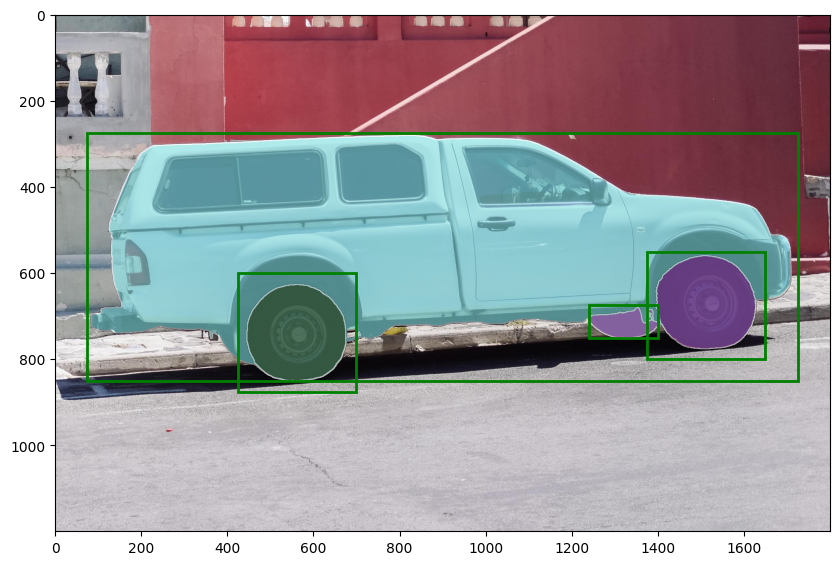

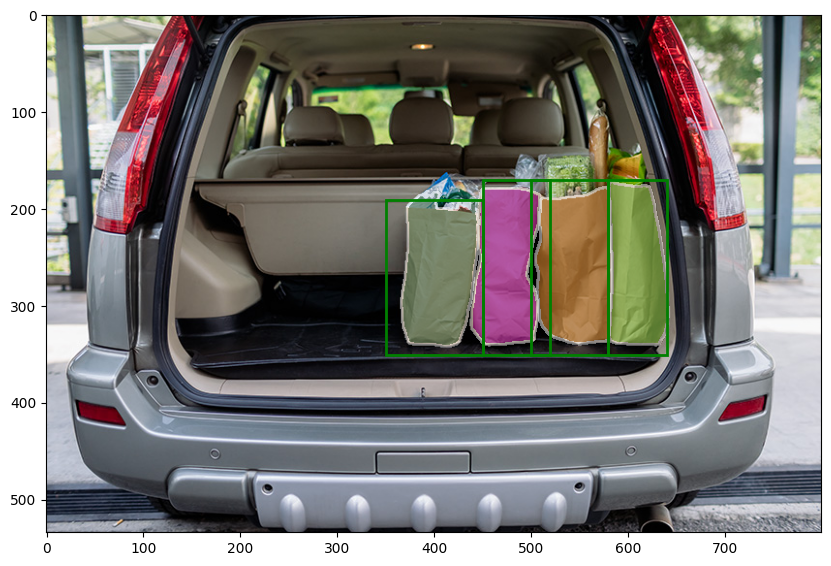

In [24]:
for image, boxes, masks in zip(img_batch, boxes_batch, best_masks):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)   
    for mask in masks:
        show_mask(mask, plt.gca(), random_color=True)
        # break
    for box in boxes:
        show_box(box, plt.gca())
        # break

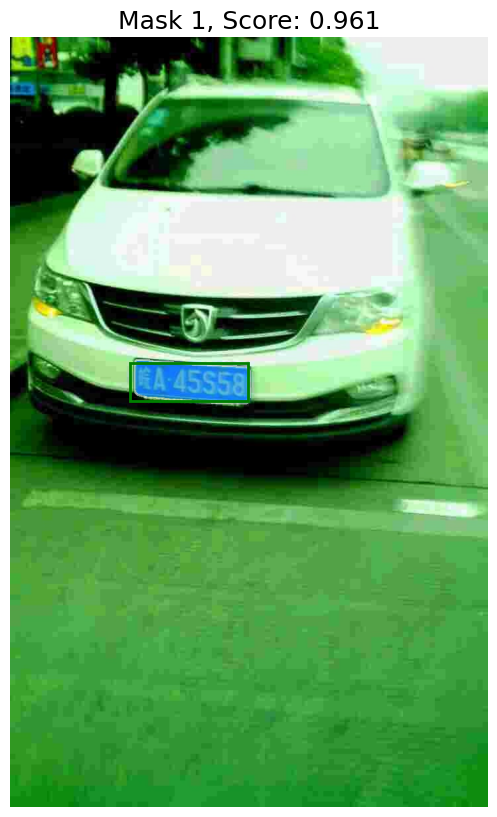

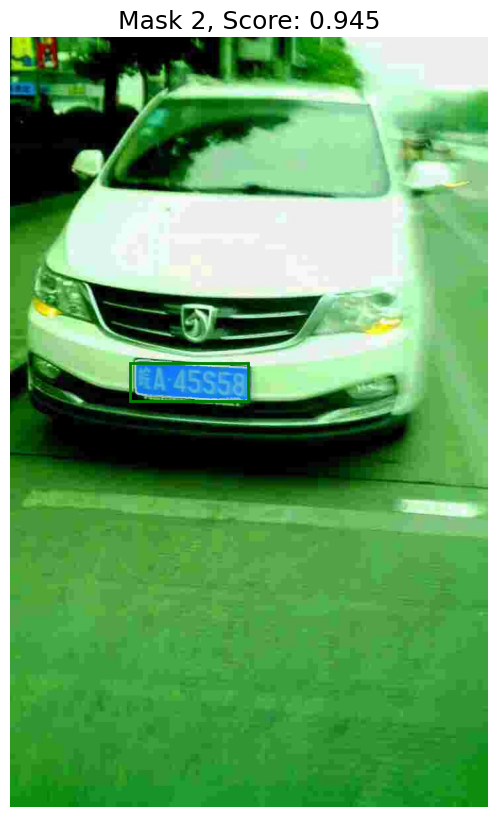

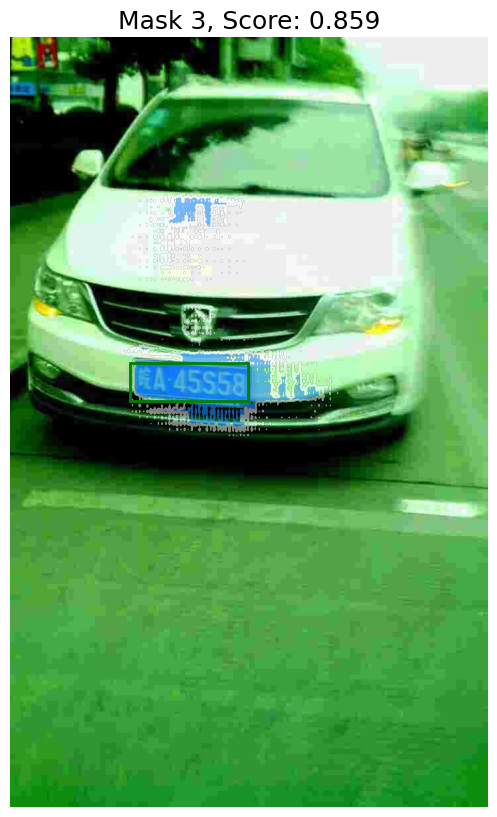

In [12]:
image_path = r'C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\CCPD2019.tar\CCPD2019\ccpd_base'
image_path += r'\0092816091954-94_82-181&490_358&548-363&554_189&540_190&484_364&498-0_0_28_29_16_29_32-133-13.jpg'
image = Image.open(image_path)
image = np.array(image.convert("RGB"))
predictor.set_image(image)
    
input_box = np.array([181, 490, 358, 548])
masks, scores, _ = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_box[None, :],
    multimask_output=True,
)
sorted_ind = np.argsort(scores)[::-1]
masks = masks[sorted_ind]
scores = scores[sorted_ind]
show_masks(image, masks, scores, box_coords=input_box, borders=True)


In [ ]:
# bbox_to_mask_coco_to_coco
import json
import os
import numpy as np
from tqdm import tqdm
from PIL import Image
from pycocotools import mask as maskUtils

from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

def visualize_rle_annotation(rle, bbox, image=None, title="RLE Mask"):
    if isinstance(rle['counts'], str):
        rle['counts'] = rle['counts'].encode('ascii')
    mask = maskUtils.decode(rle)

    import matplotlib.pyplot as plt
    if image is not None:
        plt.imshow(image, cmap='gray')
        plt.imshow(mask, cmap='jet', alpha=0.5)
    else:
        plt.imshow(mask, cmap='gray')

    if bbox is not None:
        x0, y0, x1, y1 = bbox
        plt.gca().add_patch(plt.Rectangle((x0, y0), x1 - x0, y1 - y0, edgecolor='red', facecolor='none', lw=2))
        
    plt.title(title)
    plt.axis('off')
    plt.show()

# --- CONFIG ---
COCO_JSON_PATH = r'C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Screen Detection YOLOv8\dataset\screen.json'
IMAGES_DIR = r'C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Screen Detection YOLOv8\dataset\images'  # Path to where the image files are stored
NEW_COCO_JSON_PATH = r'C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\Screen Detection YOLOv8\dataset\screen_segmentation.json'
SAM2_CHECKPOINT = r"C:\Users\Sai\Documents\Neu\Masters_Project\sam2\checkpoints\sam2.1_hiera_large.pt"
MODEL_CFG = r"C:\Users\Sai\Documents\Neu\Masters_Project\sam2\sam2\configs\sam2.1\sam2.1_hiera_l.yaml"
DEVICE = 'cuda'  # or 'cpu'
MULTIMASK = True  # Set to False if you only want a single mask per box

# --- Load COCO JSON ---
with open(COCO_JSON_PATH, 'r') as f:
    coco_data = json.load(f)

images = coco_data['images']
annotations = coco_data['annotations']
categories = coco_data['categories']

images = images[328:]

# --- Build SAM2 ---
sam2_model = build_sam2(MODEL_CFG, SAM2_CHECKPOINT, device=DEVICE)
predictor = SAM2ImagePredictor(sam2_model)

# --- Prepare Image-to-Annotation Map ---
image_id_to_annotations = {}
for ann in annotations:
    image_id_to_annotations.setdefault(ann['image_id'], []).append(ann)

# --- Conversion ---
new_annotations = []
next_ann_id = 1

batch_size = 1  # Modify if needed
for i in tqdm(range(0, len(images), batch_size)):
    batch_imgs = []
    batch_boxes = []
    img_metas = []

    for j in range(i, min(i + batch_size, len(images))):
        img_info = images[j]
        img_path = os.path.join(IMAGES_DIR, img_info['file_name'])
        print(img_path)
        img = np.array(Image.open(img_path).convert('RGB'))
        batch_imgs.append(img)
        img_metas.append(img_info)

        # Get and convert boxes
        anns = image_id_to_annotations.get(img_info['id'], [])
        xyxy_boxes = []
        for ann in anns:
            x, y, w, h = ann['bbox']
            xyxy_boxes.append([x, y, x + w, y + h])

        if xyxy_boxes:  # only append if not empty
            batch_boxes.append(np.array(xyxy_boxes, dtype=np.float32))
        else:
            batch_boxes.append(np.empty((0, 4), dtype=np.float32))

    # Skip batch if no boxes
    if all(len(b) == 0 for b in batch_boxes):
        continue

    predictor.set_image_batch(batch_imgs)
    masks_batch, scores_batch, _ = predictor.predict_batch(
        None, None,
        box_batch=batch_boxes,
        multimask_output=MULTIMASK
    )

    for img_info, anns, masks, scores, boxes, img in zip(img_metas, batch_boxes, masks_batch, scores_batch, batch_boxes, batch_imgs):
        if len(masks) == 0:
            print(f"No masks for image {img_info['id']}")
            continue

        if boxes.shape[0] == 1:
            masks = masks[None, ...]
            scores = scores[None, ...]

        selected_masks = masks[range(len(masks)), np.argmax(scores, axis=-1)] if MULTIMASK else masks[:, 0]

        for mask, ann, box in zip(selected_masks, image_id_to_annotations[img_info['id']], boxes):
            if mask.sum() == 0:
                print(f"Empty mask for image {img_info['id']}, annotation {ann['id']}") 

            rle = maskUtils.encode(np.asfortranarray(mask.astype(np.uint8)))
            area = float(maskUtils.area(rle))
            bbox = maskUtils.toBbox(rle).tolist()

            new_ann = {
                "id": next_ann_id,
                "image_id": ann['image_id'],
                "category_id": ann['category_id'],
                "segmentation": {
                    "size": rle['size'],
                    "counts": rle['counts'].decode('ascii')
                },
                "area": area,
                "bbox": bbox,
                "iscrowd": ann.get('iscrowd', 0),
            }
            new_annotations.append(new_ann)
            next_ann_id += 1

            # Visualize
            # visualize_rle_annotation(rle, image=img, bbox=box)

In [ ]:
# bbox_to_mask_ALPR_to_coco
import os
import json
from PIL import Image
import numpy as np
from tqdm import tqdm
from pycocotools import mask as maskUtils

from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

# --- CONFIG ---
DATASET_DIR = r'C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\License_plate_ALPR\UFPR-ALPR dataset'
OUT_JSON = r'C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\License_plate_ALPR\UFPR-ALPR dataset\ALPR_segmentation.json'
SAM2_CHECKPOINT = r"C:\Users\Sai\Documents\Neu\Masters_Project\sam2\checkpoints\sam2.1_hiera_large.pt"
MODEL_CFG = r"C:\Users\Sai\Documents\Neu\Masters_Project\sam2\sam2\configs\sam2.1\sam2.1_hiera_l.yaml"
DEVICE = 'cuda'
CATEGORY_ID = 1
CATEGORY_NAME = "plate"

def visualize_rle_annotation(rle, bbox, image=None, title="RLE Mask"):
    if isinstance(rle['counts'], str):
        rle['counts'] = rle['counts'].encode('ascii')
    mask = maskUtils.decode(rle)

    import matplotlib.pyplot as plt
    if image is not None:
        plt.imshow(image, cmap='gray')
        plt.imshow(mask, cmap='jet', alpha=0.5)
    else:
        plt.imshow(mask, cmap='gray')

    if bbox is not None:
        x0, y0, x1, y1 = bbox
        plt.gca().add_patch(plt.Rectangle((x0, y0), x1 - x0, y1 - y0, edgecolor='red', facecolor='none', lw=2))
        
    plt.title(title)
    plt.axis('off')
    plt.show()

# --- Setup SAM2 ---
model = build_sam2(MODEL_CFG, SAM2_CHECKPOINT, device=DEVICE)
predictor = SAM2ImagePredictor(model)

# --- Prepare Output Containers ---
images_coco = []
annotations_coco = []
categories_coco = [{"id": CATEGORY_ID, "name": CATEGORY_NAME}]

image_id = 1
annotation_id = 1

# --- Loop through dataset ---
files = []
for splitdir in os.listdir(DATASET_DIR):
    splitdir = os.path.join(DATASET_DIR, splitdir)
    if not os.path.isdir(splitdir):
        continue
    for trackdir in os.listdir(splitdir):
        trackdir = os.path.join(splitdir, trackdir)
        if not os.path.isdir(trackdir):
            continue
        for filename in os.listdir(trackdir):
            if filename.endswith(".txt"):
                files.append(os.path.join(trackdir, filename))

for file in tqdm(files):
    txt_path = os.path.join(DATASET_DIR, file)
    img_path = os.path.splitext(txt_path)[0] + '.jpg'
    if not os.path.exists(img_path):
        img_path = os.path.splitext(txt_path)[0] + '.png'
        if not os.path.exists(img_path):
            continue

    with open(txt_path, 'r') as f:
        lines = f.readlines()

    corner_line = [line for line in lines if line.startswith('corners:')]
    if not corner_line:
        continue

    # Parse corners
    corner_str = corner_line[0].split(':', 1)[1].strip()
    coords = [tuple(map(int, pt.split(','))) for pt in corner_str.split()]
    xs, ys = zip(*coords)
    x_min, y_min = min(xs), min(ys)
    x_max, y_max = max(xs), max(ys)
    xyxy_box = [x_min, y_min, x_max, y_max]

    # Load image
    img = Image.open(img_path).convert('RGB')
    img_np = np.array(img)
    h_img, w_img = img_np.shape[:2]

    # Add image metadata
    image_entry = {
        "id": image_id,
        "file_name": os.path.basename(img_path),
        "height": h_img,
        "width": w_img
    }

    # Predict mask
    predictor.set_image_batch([img_np])
    masks_batch, scores_batch, _ = predictor.predict_batch(
        None, None,
        box_batch=[np.array([xyxy_box], dtype=np.float32)],
        multimask_output=True
    )

    best_mask = masks_batch[0][np.argmax(scores_batch[0])]

    if best_mask.sum() == 0:
        print(f"Warning: Empty mask for {img_path}")
        continue

    # Convert mask to RLE
    rle = maskUtils.encode(np.asfortranarray(best_mask.astype(np.uint8)))
    area = float(maskUtils.area(rle))
    bbox = maskUtils.toBbox(rle).tolist()

    annotation = {
        "id": annotation_id,
        "image_id": image_id,
        "category_id": CATEGORY_ID,
        "segmentation": {
            "size": rle['size'],
            "counts": rle['counts'].decode('ascii')
        },
        "area": area,
        "bbox": bbox,
        "iscrowd": 0
    }

    visualize_rle_annotation(rle, image=img, bbox=xyxy_box)

    images_coco.append(image_entry)
    annotations_coco.append(annotation)
    image_id += 1
    annotation_id += 1


  0%|          | 0/15000 [00:00<?, ?it/s]

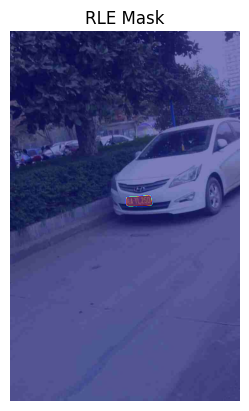

  0%|          | 1/15000 [00:01<5:32:58,  1.33s/it]

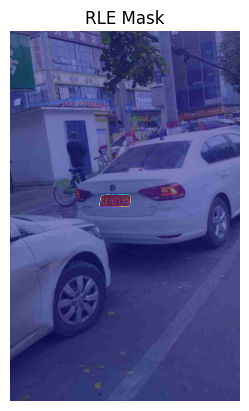

  0%|          | 2/15000 [00:01<3:43:42,  1.12it/s]

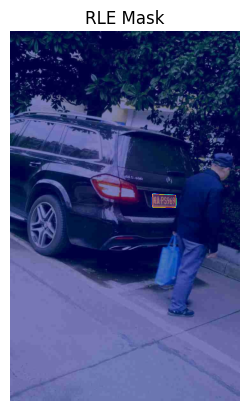

  0%|          | 3/15000 [00:02<3:00:26,  1.39it/s]

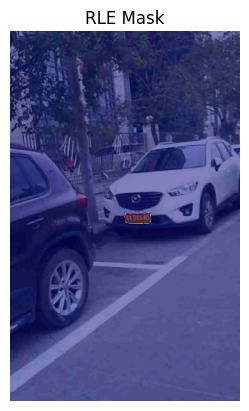

  0%|          | 4/15000 [00:02<2:40:00,  1.56it/s]

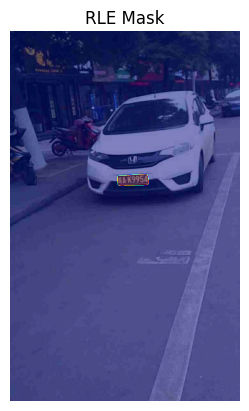

  0%|          | 5/15000 [00:03<2:27:59,  1.69it/s]

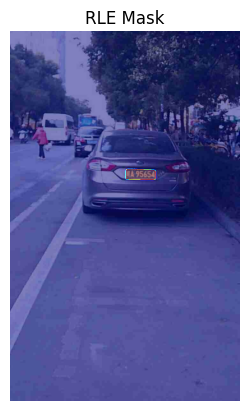

  0%|          | 6/15000 [00:04<2:23:48,  1.74it/s]

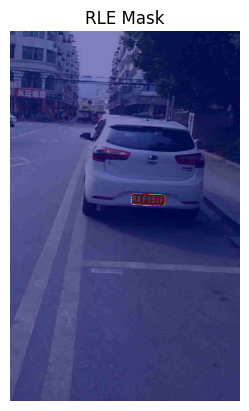

  0%|          | 7/15000 [00:04<2:20:00,  1.78it/s]

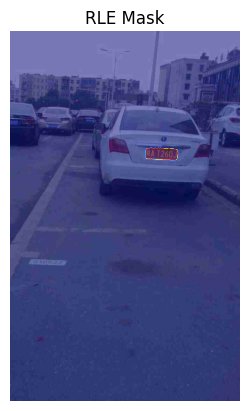

  0%|          | 8/15000 [00:05<2:15:54,  1.84it/s]

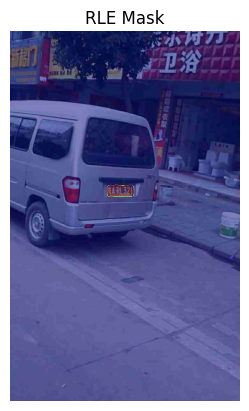

  0%|          | 9/15000 [00:05<2:13:43,  1.87it/s]

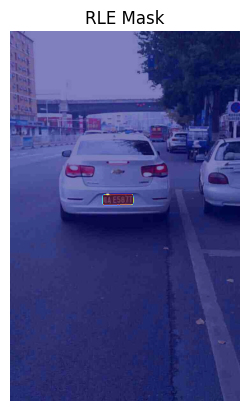

  0%|          | 10/15000 [00:06<2:11:46,  1.90it/s]

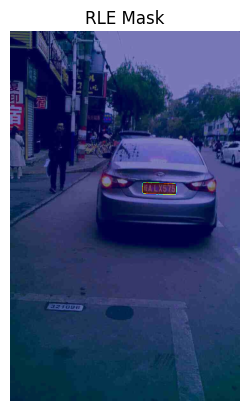

  0%|          | 11/15000 [00:06<2:11:25,  1.90it/s]

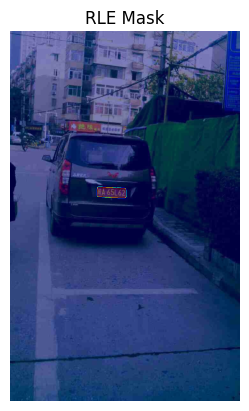

  0%|          | 12/15000 [00:07<2:11:15,  1.90it/s]

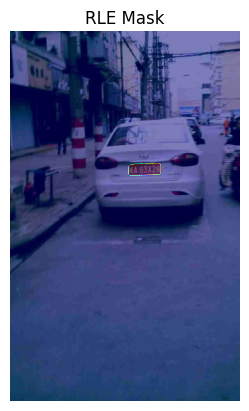

  0%|          | 13/15000 [00:07<2:10:54,  1.91it/s]

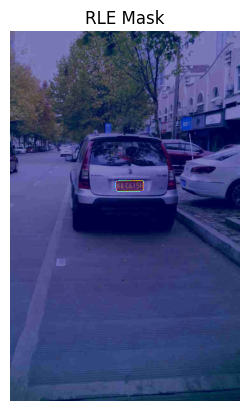

  0%|          | 14/15000 [00:08<2:09:45,  1.92it/s]

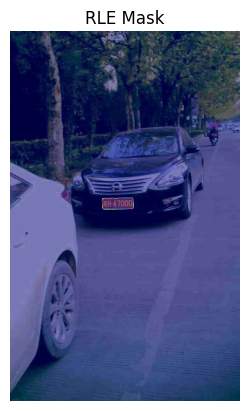

  0%|          | 15/15000 [00:08<2:09:33,  1.93it/s]

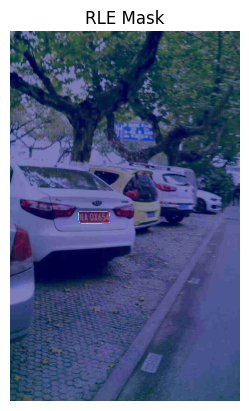

  0%|          | 16/15000 [00:09<2:10:01,  1.92it/s]

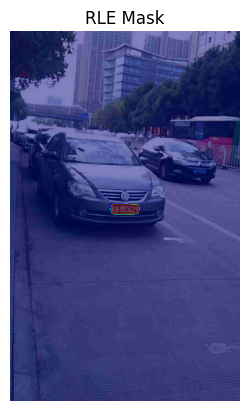

  0%|          | 17/15000 [00:09<2:10:01,  1.92it/s]

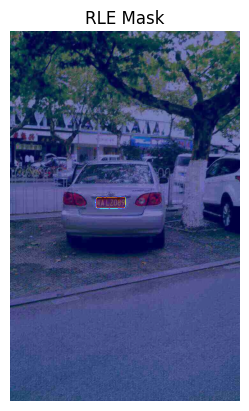

  0%|          | 18/15000 [00:10<2:09:21,  1.93it/s]

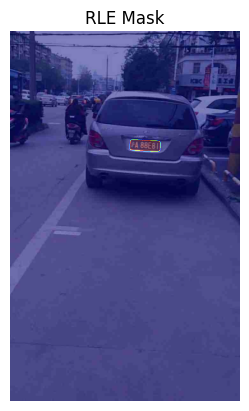

  0%|          | 19/15000 [00:10<2:08:41,  1.94it/s]

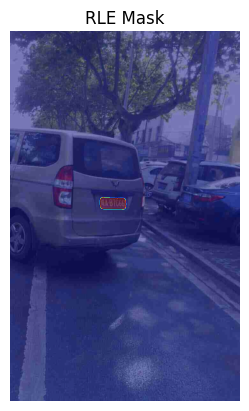

  0%|          | 20/15000 [00:11<2:09:02,  1.93it/s]

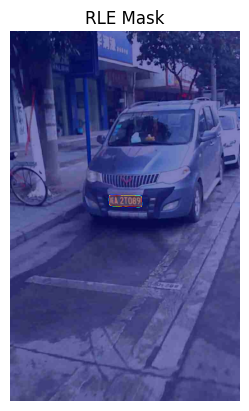

  0%|          | 21/15000 [00:11<2:08:50,  1.94it/s]

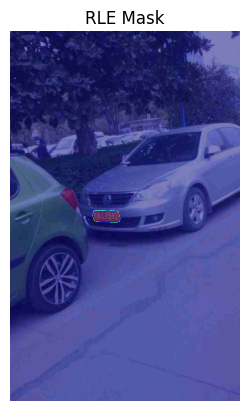

  0%|          | 22/15000 [00:12<2:08:23,  1.94it/s]

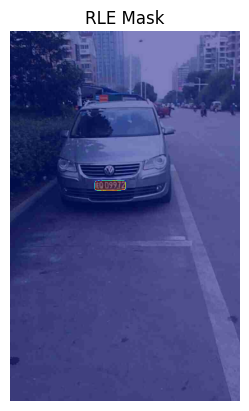

  0%|          | 23/15000 [00:12<2:08:01,  1.95it/s]

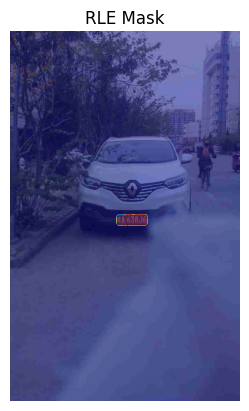

  0%|          | 24/15000 [00:13<2:07:39,  1.96it/s]

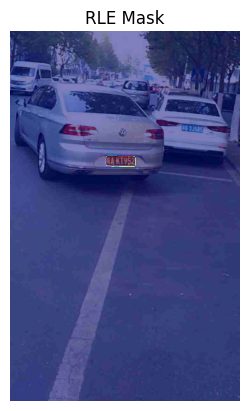

  0%|          | 25/15000 [00:13<2:08:11,  1.95it/s]

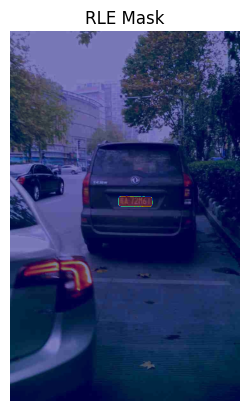

  0%|          | 26/15000 [00:14<2:08:22,  1.94it/s]

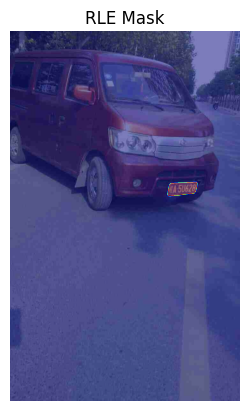

  0%|          | 27/15000 [00:14<2:08:35,  1.94it/s]

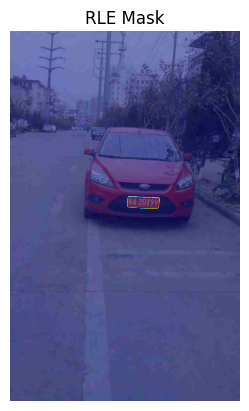

  0%|          | 28/15000 [00:15<2:09:04,  1.93it/s]

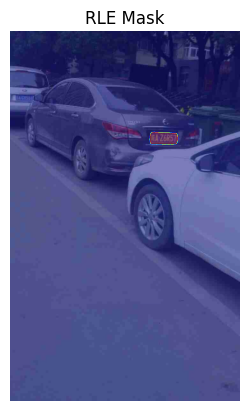

  0%|          | 29/15000 [00:15<2:09:03,  1.93it/s]

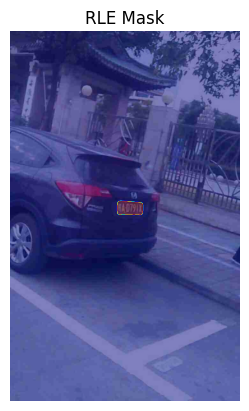

  0%|          | 30/15000 [00:16<2:09:29,  1.93it/s]

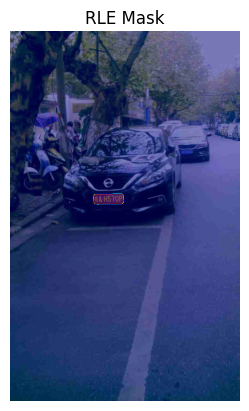

  0%|          | 31/15000 [00:16<2:08:53,  1.94it/s]

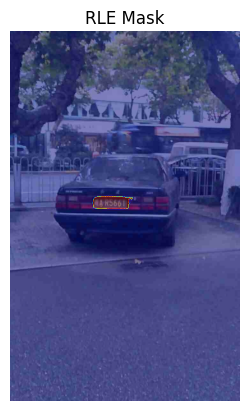

  0%|          | 32/15000 [00:17<2:10:12,  1.92it/s]

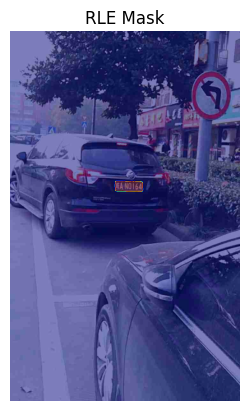

  0%|          | 33/15000 [00:17<2:10:18,  1.91it/s]

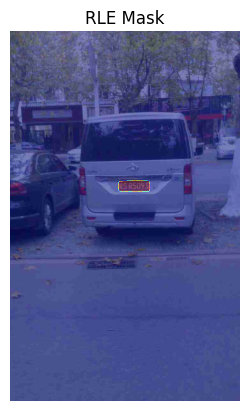

  0%|          | 34/15000 [00:18<2:09:58,  1.92it/s]

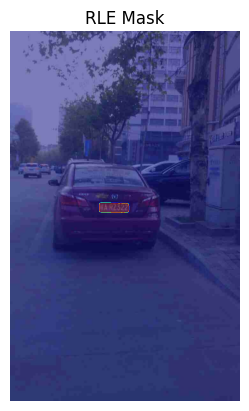

  0%|          | 35/15000 [00:18<2:08:21,  1.94it/s]

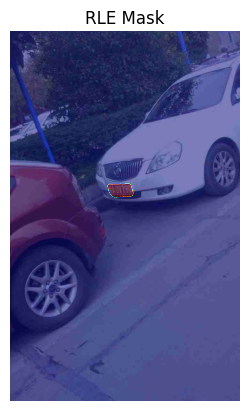

  0%|          | 36/15000 [00:19<2:07:56,  1.95it/s]

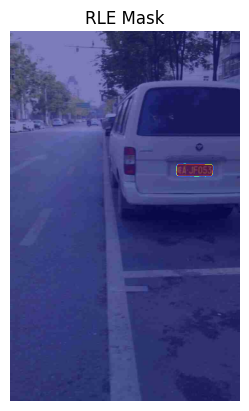

  0%|          | 37/15000 [00:20<2:08:43,  1.94it/s]

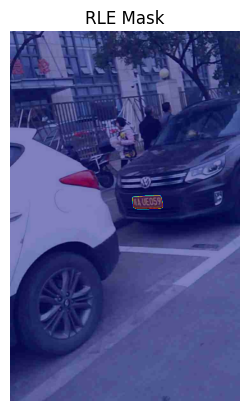

  0%|          | 38/15000 [00:20<2:08:40,  1.94it/s]

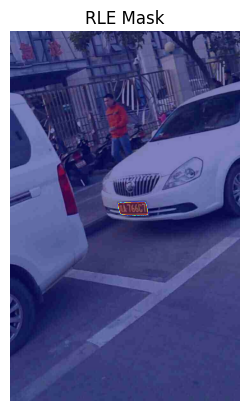

  0%|          | 39/15000 [00:21<2:08:24,  1.94it/s]

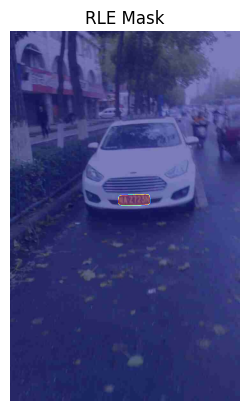

  0%|          | 40/15000 [00:21<2:08:29,  1.94it/s]

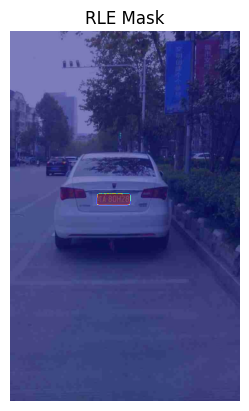

  0%|          | 41/15000 [00:22<2:07:59,  1.95it/s]

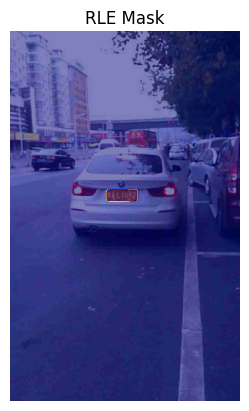

  0%|          | 42/15000 [00:22<2:07:48,  1.95it/s]

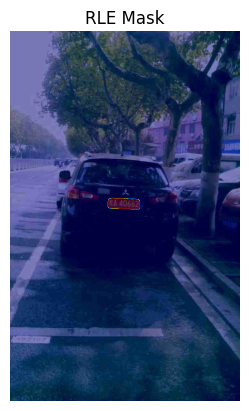

  0%|          | 43/15000 [00:23<2:08:41,  1.94it/s]

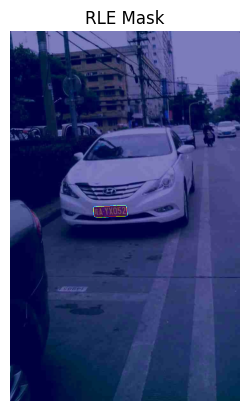

  0%|          | 44/15000 [00:23<2:08:13,  1.94it/s]

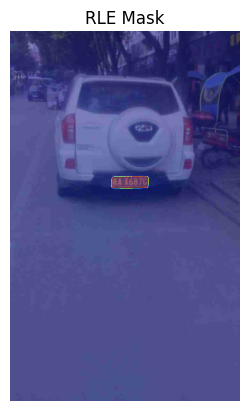

  0%|          | 45/15000 [00:24<2:08:02,  1.95it/s]

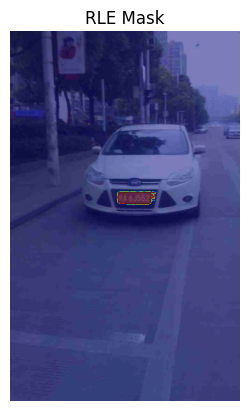

  0%|          | 46/15000 [00:24<2:07:32,  1.95it/s]

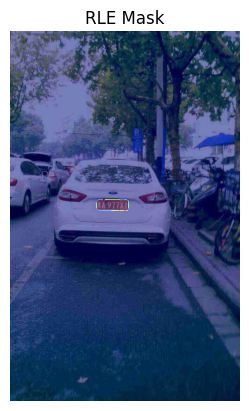

  0%|          | 47/15000 [00:25<2:09:09,  1.93it/s]

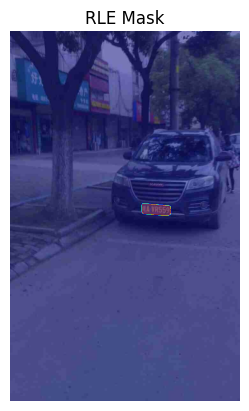

  0%|          | 48/15000 [00:25<2:08:58,  1.93it/s]

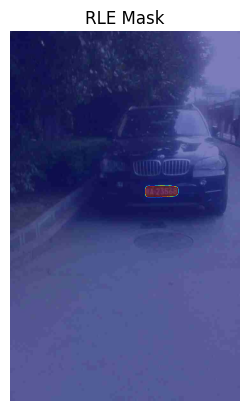

  0%|          | 49/15000 [00:26<2:08:27,  1.94it/s]

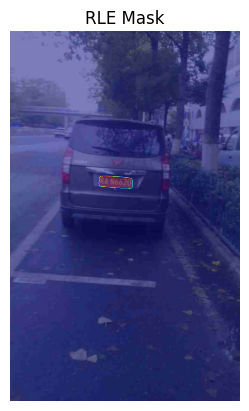

  0%|          | 50/15000 [00:26<2:08:06,  1.95it/s]

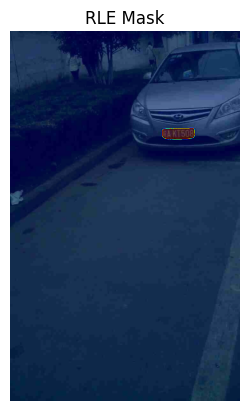

  0%|          | 51/15000 [00:27<2:07:54,  1.95it/s]

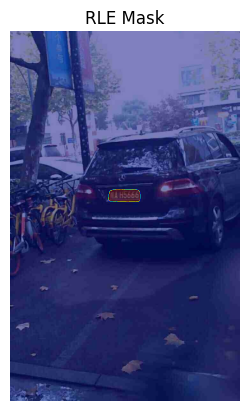

  0%|          | 52/15000 [00:27<2:08:20,  1.94it/s]

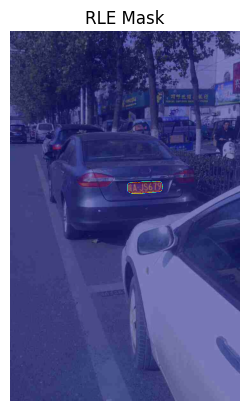

  0%|          | 53/15000 [00:28<2:08:56,  1.93it/s]

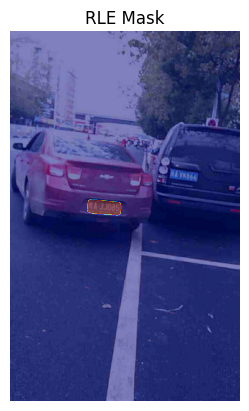

  0%|          | 54/15000 [00:28<2:12:03,  1.89it/s]

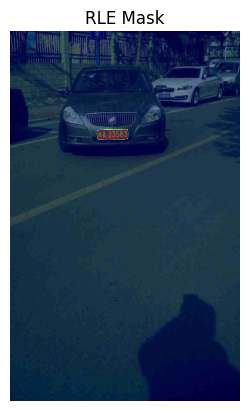

  0%|          | 55/15000 [00:29<2:12:53,  1.87it/s]

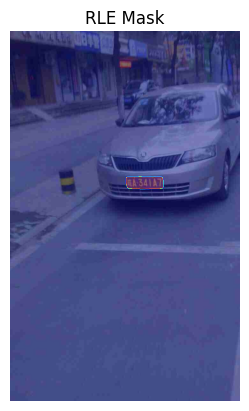

  0%|          | 56/15000 [00:29<2:12:03,  1.89it/s]

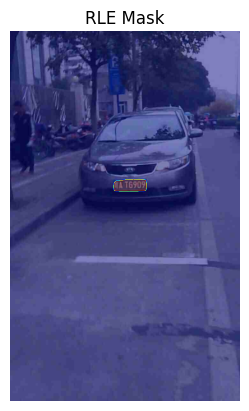

  0%|          | 57/15000 [00:30<2:11:48,  1.89it/s]

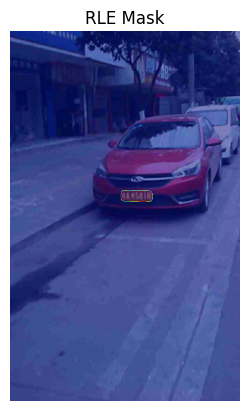

  0%|          | 58/15000 [00:30<2:10:32,  1.91it/s]

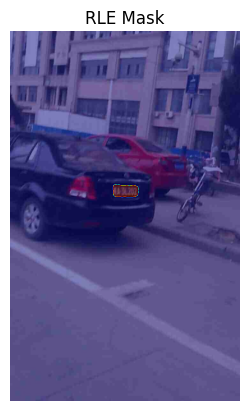

  0%|          | 59/15000 [00:31<2:09:36,  1.92it/s]

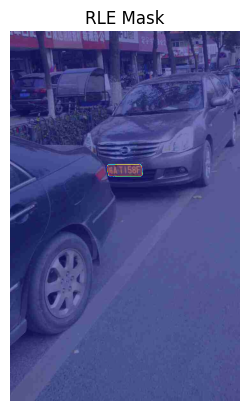

  0%|          | 60/15000 [00:31<2:09:23,  1.92it/s]

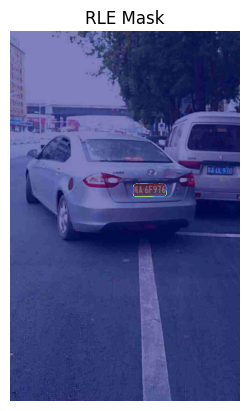

  0%|          | 61/15000 [00:32<2:09:18,  1.93it/s]

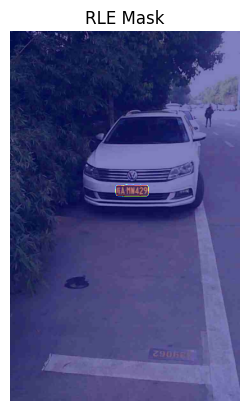

  0%|          | 62/15000 [00:32<2:08:03,  1.94it/s]

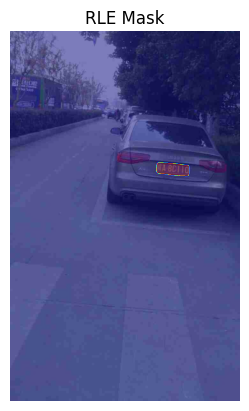

  0%|          | 63/15000 [00:33<2:08:55,  1.93it/s]

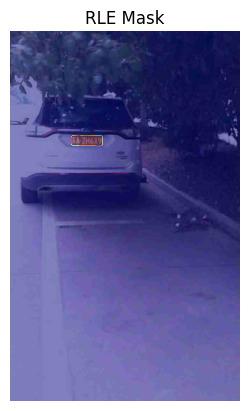

  0%|          | 64/15000 [00:34<2:19:14,  1.79it/s]

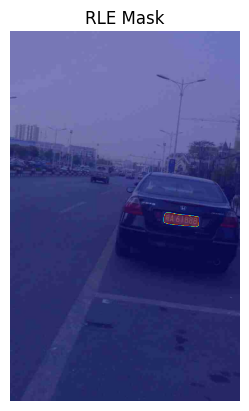

  0%|          | 65/15000 [00:34<2:14:56,  1.84it/s]

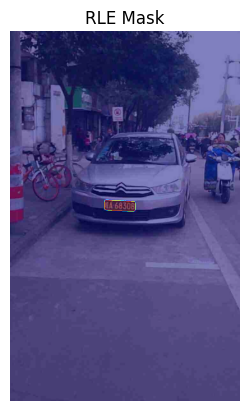

  0%|          | 66/15000 [00:35<2:14:17,  1.85it/s]


KeyboardInterrupt: 

In [1]:
# bbox_to_mask_ccpd_to_coco
import os
import json
from PIL import Image
import numpy as np
from tqdm import tqdm
from pycocotools import mask as maskUtils

from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor

def visualize_rle_annotation(rle, bbox=None, image=None, title="RLE Mask"):
    if isinstance(rle['counts'], str):
        rle['counts'] = rle['counts'].encode('ascii')
    mask = maskUtils.decode(rle)

    import matplotlib.pyplot as plt
    if image is not None:
        plt.imshow(image, cmap='gray')
        plt.imshow(mask, cmap='jet', alpha=0.5)
    else:
        plt.imshow(mask, cmap='gray')

    if bbox is not None:
        x0, y0, x1, y1 = bbox
        plt.gca().add_patch(plt.Rectangle((x0, y0), x1 - x0, y1 - y0, edgecolor='red', facecolor='none', lw=2))
        
    plt.title(title)
    plt.axis('off')
    plt.show()

# --- CONFIG ---
CCPD_DIR = r'C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\CCPD2019.tar\CCPD2019\ccpd_base'
OUTPUT_JSON = r'C:\Users\Sai\Documents\Neu\Masters_Project\PerceptionPrivacy\datasets\classes\CCPD2019.tar\CCPD2019\ccpd_coco_segmentation.json'
SAM2_CHECKPOINT = r"C:\Users\Sai\Documents\Neu\Masters_Project\sam2\checkpoints\sam2.1_hiera_large.pt"
MODEL_CFG = r"C:\Users\Sai\Documents\Neu\Masters_Project\sam2\sam2\configs\sam2.1\sam2.1_hiera_l.yaml"
DEVICE = 'cuda'
CATEGORY_ID = 1
CATEGORY_NAME = 'license_plate'

# --- Init SAM2 ---
sam2_model = build_sam2(MODEL_CFG, SAM2_CHECKPOINT, device=DEVICE)
predictor = SAM2ImagePredictor(sam2_model)

# --- Output Containers ---
images_coco = []
annotations_coco = []
categories_coco = [{"id": CATEGORY_ID, "name": CATEGORY_NAME}]

image_id = 1
annotation_id = 1

files = [f for f in os.listdir(CCPD_DIR) if f.endswith(('.jpg', '.png'))]
files = files[:15000]
for filename in tqdm(files):
    img_path = os.path.join(CCPD_DIR, filename)

    # Parse corner field from filename
    fields = filename.split('-')
    if len(fields) < 3:
        print(f"Skipping malformed filename: {filename}")
        continue

    try:
        bbox_pts = fields[2].split('_')
        x1, y1 = map(int, bbox_pts[0].split('&'))
        x2, y2 = map(int, bbox_pts[1].split('&'))
        xyxy_box = [x1, y1, x2, y2]
    except Exception as e:
        print(f"Error parsing bbox from: {filename} | {e}")
        continue

    # Load image
    img = Image.open(img_path).convert('RGB')
    img_np = np.array(img)
    h_img, w_img = img_np.shape[:2]

    # Add image entry
    images_coco.append({
        "id": image_id,
        "file_name": filename,
        "height": h_img,
        "width": w_img
    })

    # Run SAM2
    predictor.set_image_batch([img_np])
    masks_batch, scores_batch, _ = predictor.predict_batch(
        None, None,
        box_batch=[np.array([xyxy_box], dtype=np.float32)],
        multimask_output=True
    )

    best_mask = masks_batch[0][np.argmax(scores_batch[0])]

    if best_mask.sum() == 0:
        print(f"Empty mask for {filename}")
        continue

    rle = maskUtils.encode(np.asfortranarray(best_mask.astype(np.uint8)))
    area = float(maskUtils.area(rle))
    bbox = maskUtils.toBbox(rle).tolist()

    annotations_coco.append({
        "id": annotation_id,
        "image_id": image_id,
        "category_id": CATEGORY_ID,
        "segmentation": {
            "size": rle['size'],
            "counts": rle['counts'].decode('ascii')
        },
        "area": area,
        "bbox": bbox,
        "iscrowd": 0
    })

    visualize_rle_annotation(rle, image=img, bbox=None)

    image_id += 1
    annotation_id += 1
